# Deep neural nets for object recognition
In this exercise, you will first develop a fully connected neural net model and test it on the CIFAR-10 problem. Then, you will build a convolutional neural net model and test it on the same CIFAR-10 problem. The purpose of this part of the exercise is to give you a working understanding of neural net models and give you experience in tuning their (many) hyper-parameters.

Then, you will use a Resnet model pretrained on Imagenet and test its out-of-the-box performance on CIFAR-10. You will finetune the pretrained Resnet model on CIFAR-10 and test its performance on a set aside test set. Finally, you will use data augmentation and finetune the pretrained Resnet model with augmented data, and check its performance on a set aside test set.

You will then comment on performance differences between fully connected networks and CNNs trained from scratch on CIFAR-10, relative to the performance you saw with linear models (softmax, GDA and SVM). You will also comment on the use of finetuning pre-trained models and the role of data augmentation fine tuning large parameter models.

In [2]:
!pip install torchview

In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.models import ResNet18_Weights

import numpy as np
import matplotlib.pyplot as plt
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim
from tqdm import tqdm
from torchview import draw_graph

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import sklearn
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import copy

# The CIFAR10 dataset
- Download and normalize the CIFAR10 dataset from torchvision
- Split the CIFAR10 data into train, validation and test set
- Set the batch size for processing these datasets
- Build the dataloaders for train, validation, and test set which will be used in the training loop
- Define the string class labels (targets are numeric 0-9)

In [4]:
# mean and std for the RGB channels in CIFAR10
tmean = [0.49139968, 0.48215841, 0.44653091]
tstd = [0.24703223, 0.24348513, 0.26158784]

# Image size
img_size=224

# transform the 32x32x3 images into a tensor after normalizing
# each channel using the parameters above

transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(tmean, tstd)])

# download and transform the  trainset and testset for training
trainset = torchvision.datasets.CIFAR10(root='./data',train=True,download=True,transform=transform)
testset = torchvision.datasets.CIFAR10(root='./data',train=False,download=True,transform=transform)

torch.manual_seed(42)  # for reproducibility

#split trainset into a train and a val set (90-10 split)
lengths = [int(p * len(trainset)) for p in [0.9,0.1]]
tr,v = torch.utils.data.random_split(trainset,lengths)
train_sampler = torch.utils.data.SubsetRandomSampler(tr.indices)
val_sampler = torch.utils.data.SubsetRandomSampler(v.indices)

# set batch size and set up the data generators for train, val, test sets
batch_size = 64
trainloader = torch.utils.data.DataLoader(trainset,batch_size=batch_size,sampler=train_sampler)
valloader = torch.utils.data.DataLoader(trainset,batch_size=batch_size,sampler=val_sampler)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size)

print("Number of training batches = ",len(trainloader))
print("Number of validation batches = ",len(valloader))
print("Number of test batches = ",len(testloader))

# define the output classes
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

100%|██████████| 170M/170M [00:03<00:00, 49.1MB/s]


Number of training batches =  704
Number of validation batches =  79
Number of test batches =  157


# Visualize the training data

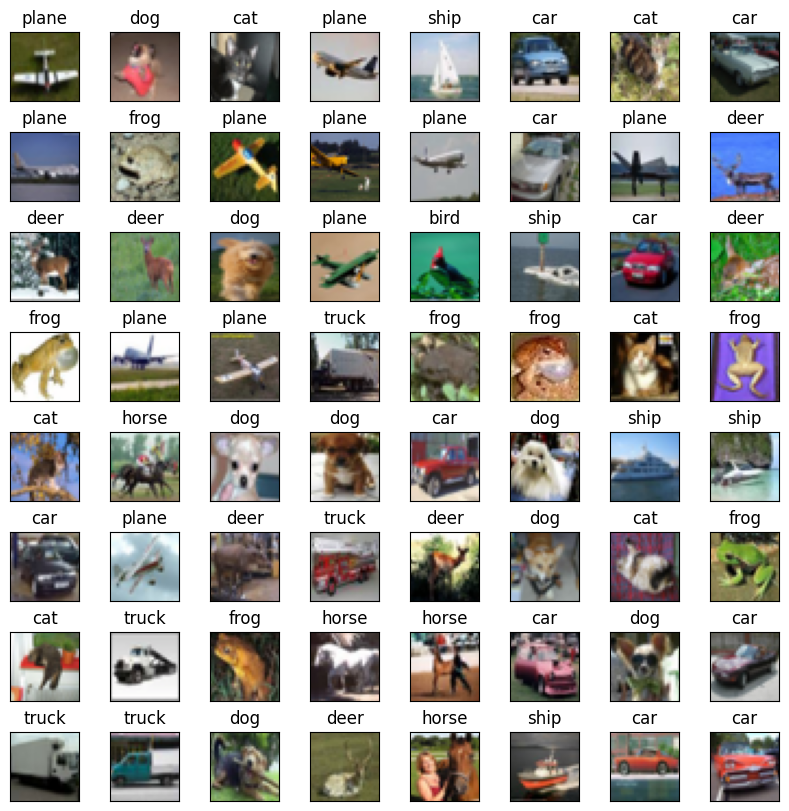

In [5]:
Xtr,ytr = next(iter(trainloader))
# make a 8x8 grid and display 64 images from the first batch of training data
rows,cols = 8,8
fig = plt.figure(figsize=(8,8),constrained_layout=True)

for i in range(0,rows*cols):
    fig.add_subplot(rows,cols,i+1)
    tmp = np.transpose(Xtr[i].numpy(),(1,2,0))
    plt.imshow(((tmp*tstd + tmean)*255).astype(np.uint8))
    plt.xticks([])
    plt.yticks([])
    plt.title(classes[ytr[i].numpy()])

# A five layer fully connected (FC) feedforward network (20 points)
- has an input layer, two hidden layers, and an output layer
- complete the function definitions below
- you will find d2l.ai Chapters 5.2, 5.6, 6.1, 6.2, 6.3 very useful

In [6]:
class FiveLayerFC(nn.Module):

    def __init__(self, input_size, hidden_size1, hidden_size2, num_classes,lr,wd):
        super().__init__()
        # set up learning rate lr and weight decay wd
        # set up the network structure using nn.Sequential
        # use the ReLU non-linearity after all the hidden layers
        # use Xavier normal initialization for the weights in the hidden layers
        # use zero initialization for the bias weights
        # do not forget to Flatten the input before passing it to the first hidden layer
        ######## START YOUR CODE HERE (7-10 lines)
        self.lr = lr
        self.wd = wd
        self.net = nn.Sequential(
            nn.Flatten(),
            nn.Linear(input_size, hidden_size1),
            nn.ReLU(),
            nn.Linear(hidden_size1, hidden_size2),
            nn.ReLU(),
            nn.Linear(hidden_size2, num_classes)
        )
        for layer in self.net:
            if isinstance(layer, nn.Linear):
                nn.init.xavier_normal_(layer.weight)
                nn.init.zeros_(layer.bias)

        ######## END YOUR CODE HERE

    def forward(self, x):
        # forward propagate the input x through the network
        # output should be a vector of dimension 10
        ######## START YOUR CODE HERE (1 line)
        return self.net(x)
        ######## END YOUR CODE HERE

    def loss(self,yhat,y,averaged=True):
        # use nn.functional.cross_entropy() to evaluate loss with prediction (yhat)
        # and truth (y). Average it over a batch.
        ######### START YOUR CODE HERE (1-2 lines)
        return nn.functional.cross_entropy(yhat, y, reduction='mean' if averaged else 'none')
        ######### END YOUR CODE HERE

    def predict(self,x):
       # propagate x forward and return the index of the
       # the highest valued output component
       ######## START YOUR CODE HERE (1 line)
       return torch.argmax(self.forward(x), dim=1)
       ######### END YOUR CODE HERE

    def configure_optimizers(self):
        # set up the Adam optimizer with learning rate and weight decay specified
        # in the model object
        ######## START YOUR CODE HERE (1 line)
        return optim.Adam(self.parameters(), lr=self.lr, weight_decay=self.wd)
        ######### END YOUR CODE HERE

# Test the FiveLayerFC class
- set the device to GPU if you have access to it.
- In Google Colab, you can select runtime, and pick the free T4 GPU choice.
- to understand how GPU memory and CPU memory interact, read Section 6.7 of the d2l.ai textbook.

Device is:  cuda
torch.Size([64, 10])


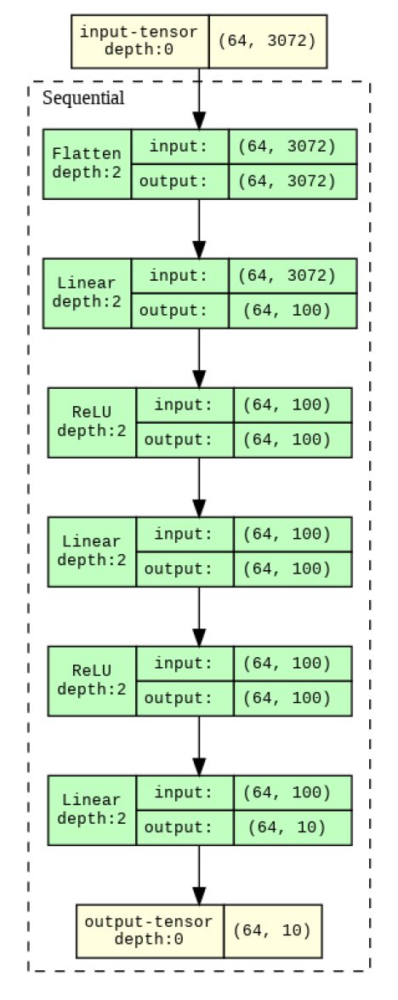

In [7]:
lr = 1e-2
wd = 1e-2

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Device is: ', device)

def test_FiveLayerFC(lr,wd):
    input_size = 32*32*3
    x = torch.zeros((64, input_size), dtype=torch.float).to(device)  # minibatch size 64, feature dimension 50
    model = FiveLayerFC(input_size, 100, 100,10,lr,wd).to(device)
    outputs = model(x)
    print(outputs.size())  # you should see [64, 10]
    model_graph = draw_graph(
        model,
        input_size=x.shape,
        expand_nested=True,
        save_graph=True,
        filename="my_Five_layer_FC_model",
        directory="./"
    )

test_FiveLayerFC(lr,wd)

# draw the model
plt.figure(figsize=(20, 15))
plt.imshow(mpimg.imread('my_Five_layer_FC_model.png'))
plt.axis('off') # Turn off axis numbers and ticks
plt.show()

# Checking the network setup (15 points)
As a sanity check, make sure you can overfit a small dataset of 64 images. We will use a five-layer network with 100 units in the two hidden layers. You will need to tweak the learning rate and weight decay, but you should be able to overfit and achieve 100% training accuracy within 20 epochs. We have given you parameter choices that work. You should report on at least another choice of learning rate and weight decay that allows you to fit the training data to 100% accuracy within 20 epochs.

Complete the function train_model_small that takes a single batch (Xtr,ytr) of 64 images and their labels for training, and a single batch (Xval,yval) of validation images and trains an initialized model for num_epochs epochs.

- Initialize train_loss and val_loss (which will hold training and validation set loss for each epoch)
- Configure optimizer for the model
- for epoch in range(num_epochs)
    - zero out gradients in the optimizer
    - compute output of network by forward propagating Xtr through network
    - compute loss using output and ytr
    - backpropagate the loss
    - store the training loss for this epoch
    - compute validation set loss for this epoch (remember to turn off gradient update with torch.no_grad())
- return model, train_loss and val_loss


In [9]:
Xtr,ytr = next(iter(trainloader))
Xval, yval = next(iter(valloader))
num_epochs = 20

lr = 1e-2
wd = 1e-3

def train_model_small(model,Xtr,ytr,Xval,yval,num_epochs):

    ####### START YOUR CODE HERE (10-14 lines)
    train_loss = []
    val_loss = []
    optimizer = model.configure_optimizers()
    model.to(device) # Move model to the device

    for epoch in range(num_epochs):
        optimizer.zero_grad()
        yhat = model(Xtr.to(device))
        loss = model.loss(yhat, ytr.to(device))
        loss.backward()
        optimizer.step()
        train_loss.append(loss.item())

        with torch.no_grad():
            yhat_val = model(Xval.to(device))
            val_l = model.loss(yhat_val, yval.to(device))
            val_loss.append(val_l.item())
    ######## END YOUR CODE HERE

    return model,train_loss,val_loss

model = FiveLayerFC(32*32*3,100,100,10,lr,wd)
model,train_loss,val_loss = train_model_small(model,Xtr,ytr,Xval,yval,num_epochs)
torch.save(model.state_dict(), 'model_small.pth')

In [10]:
def plot_loss_curves(num_epochs,train_loss,val_loss):
   plt.plot(torch.arange(num_epochs),train_loss, label="train_loss")
   plt.plot(torch.arange(num_epochs),val_loss, label="val_loss")
   plt.title("Training and Validation Loss Curves")
   plt.xlabel("Epoch")
   plt.ylabel("Loss")
   plt.legend()

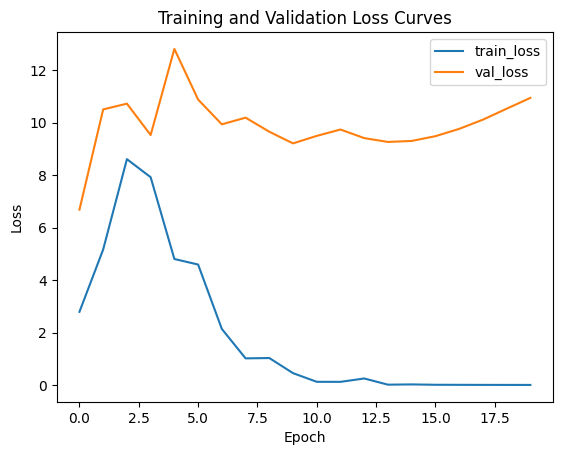

In [11]:
# plot the loss curve for the small model training

plot_loss_curves(num_epochs,train_loss,val_loss)

# Test your model on the training set
- you should get 100% accuracy

In [13]:
with torch.no_grad():
    ypred = model.predict(Xtr.to(device))

    cm = sklearn.metrics.confusion_matrix(ytr,ypred.cpu())
    acc = sklearn.metrics.accuracy_score(ytr,ypred.cpu())
    print('Accuracy on test set = ',acc)
    print(cm)
    print(sklearn.metrics.classification_report(ytr,ypred.cpu()))

Accuracy on test set =  1.0
[[ 8  0  0  0  0  0  0  0  0  0]
 [ 0 10  0  0  0  0  0  0  0  0]
 [ 0  0  4  0  0  0  0  0  0  0]
 [ 0  0  0  8  0  0  0  0  0  0]
 [ 0  0  0  0  9  0  0  0  0  0]
 [ 0  0  0  0  0  3  0  0  0  0]
 [ 0  0  0  0  0  0  5  0  0  0]
 [ 0  0  0  0  0  0  0  6  0  0]
 [ 0  0  0  0  0  0  0  0  6  0]
 [ 0  0  0  0  0  0  0  0  0  5]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         8
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00         4
           3       1.00      1.00      1.00         8
           4       1.00      1.00      1.00         9
           5       1.00      1.00      1.00         3
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         6
           8       1.00      1.00      1.00         6
           9       1.00      1.00      1.00         5

    accuracy                           1.00  

# Train the full model (25 points)
- Initialize train_loss and val_loss (which will hold training and validation set loss for each epoch)
- Configure optimizer for the model
- for epoch in range(num_epochs)
    - for each batch (Xtr,ytr) in training set
       - zero out gradients in the optimizer
       - compute output of network by forward propagating Xtr through network
       - compute loss using output and ytr
       - backpropagate the loss
       - update the parameters with .step() on optimizer
       - accumulate the training loss for this batch
    - store training loss for this epoch
    - compute validation set loss for this epoch (remember to turn off gradient update with torch.no_grad()) and remember to iterate over all the batches of the validation set
    
- return model, train_loss and val_loss

In [14]:
def train_model(model,trainloader,valloader,num_epochs):
    ######## START YOUR CODE HERE (20-24 lines)
    train_loss = []
    val_loss = []
    optimizer = model.configure_optimizers()
    model.to(device)

    for epoch in range(num_epochs):
        model.train() # Set model to training mode
        running_train_loss = 0.0
        for i, data in enumerate(trainloader):
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs = model(inputs)
            loss = model.loss(outputs, labels)
            loss.backward()
            optimizer.step()

            running_train_loss += loss.item()

        train_loss.append(running_train_loss / len(trainloader))

        model.eval() # Set model to evaluation mode
        running_val_loss = 0.0
        with torch.no_grad():
            for i, data in enumerate(valloader):
                inputs, labels = data
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = model.loss(outputs, labels)
                running_val_loss += loss.item()
        val_loss.append(running_val_loss / len(valloader))

        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss[-1]:.4f}, Val Loss: {val_loss[-1]:.4f}')

    ######## END YOUR CODE HERE
    return model,train_loss,val_loss

# Train and test performance of model
- hyperparameter choice: lr = 1e-5, weight_decay = 1e-2
- train the model using training and validation data
- get accuracy, confusion matrix and classification report on test data

In [15]:
# test a model with a testloader
# return an array of test images, true labels, predicted labels

def model_eval(model,testloader):
    X_test_list = [] # Use a list to store batches of test data
    with torch.no_grad():
        ys=[]
        outputs=[]
        for i, tdata in enumerate(testloader):
            tX,ty = tdata
            tX=tX.to(device)
            X_test_list.append(tX.detach().cpu().numpy())
            ty=ty.to(device)
            output = model.predict(tX)
            ys.append(ty.detach().cpu().numpy())
            outputs.append(output.detach().cpu().numpy())

    X_test = np.concatenate(X_test_list)
    ys=np.hstack(ys)
    outputs= np.hstack(outputs)
    cm = sklearn.metrics.confusion_matrix(ys,outputs)
    print("****************************************************************************************")
    print("performance report")
    print(sklearn.metrics.classification_report(ys,outputs))
    print("confusion matrix:")
    disp = sklearn.metrics.ConfusionMatrixDisplay(cm,display_labels=classes)
    disp.plot()
    return X_test,ys,outputs

Epoch 1/20, Train Loss: 2.0387, Val Loss: 1.8582
Epoch 2/20, Train Loss: 1.7780, Val Loss: 1.7536
Epoch 3/20, Train Loss: 1.6894, Val Loss: 1.6964
Epoch 4/20, Train Loss: 1.6350, Val Loss: 1.6615
Epoch 5/20, Train Loss: 1.5942, Val Loss: 1.6283
Epoch 6/20, Train Loss: 1.5614, Val Loss: 1.6094
Epoch 7/20, Train Loss: 1.5325, Val Loss: 1.5813
Epoch 8/20, Train Loss: 1.5091, Val Loss: 1.5657
Epoch 9/20, Train Loss: 1.4876, Val Loss: 1.5529
Epoch 10/20, Train Loss: 1.4687, Val Loss: 1.5404
Epoch 11/20, Train Loss: 1.4508, Val Loss: 1.5345
Epoch 12/20, Train Loss: 1.4353, Val Loss: 1.5185
Epoch 13/20, Train Loss: 1.4206, Val Loss: 1.5133
Epoch 14/20, Train Loss: 1.4071, Val Loss: 1.5115
Epoch 15/20, Train Loss: 1.3950, Val Loss: 1.4985
Epoch 16/20, Train Loss: 1.3831, Val Loss: 1.4887
Epoch 17/20, Train Loss: 1.3718, Val Loss: 1.4811
Epoch 18/20, Train Loss: 1.3608, Val Loss: 1.4805
Epoch 19/20, Train Loss: 1.3508, Val Loss: 1.4707
Epoch 20/20, Train Loss: 1.3405, Val Loss: 1.4660
*********

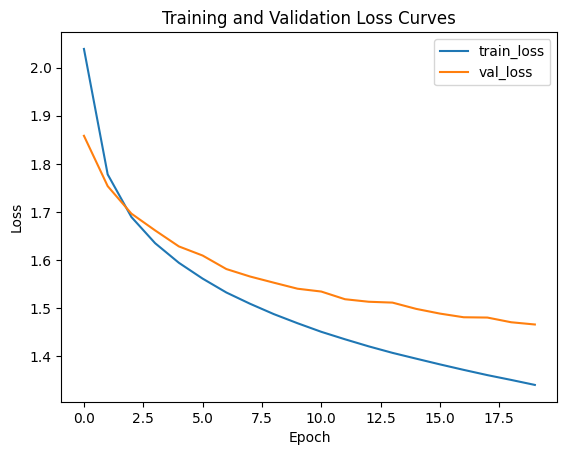

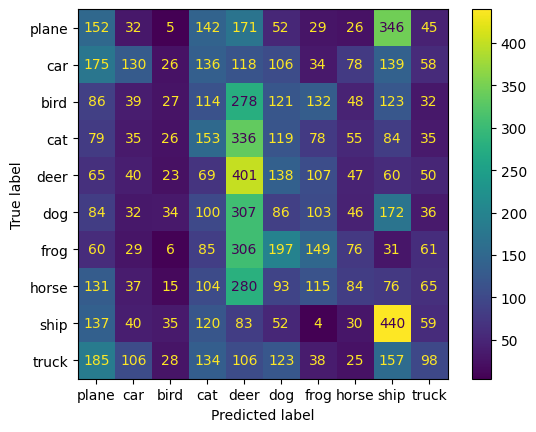

In [16]:
lr = 1e-5
wd = 1e-2
num_epochs = 20

model_mlp = FiveLayerFC(32*32*3,200,200,10,lr,wd).to(device)
model_mlp,train_loss,val_loss = train_model(model_mlp,trainloader,valloader,num_epochs)
torch.save(model_mlp.state_dict(), 'model_mlp.pth')

plot_loss_curves(num_epochs,train_loss,val_loss)
X_test, ys, outputs = model_eval(model,testloader)


# Visualization of confusion matrix

In [17]:
# Some plot utilities

def denormalize(img):
    """Undo CIFAR-10 normalization and convert to uint8 for imshow."""
    img = np.transpose(img, (1, 2, 0))           # CHW -> HWC
    img = (img * tstd + tmean) * 255.0
    return np.clip(img, 0, 255).astype(np.uint8)

# Only use this for models in augmented data
def plot_confused_classes_aug(model, testloader, classes, cl_a, cl_b):
    X_aa_list = []
    X_ab_list = []
    X_ba_list = []
    X_bb_list = []

    with torch.no_grad():
        for X, y in testloader:
            X = X.to(device)
            y = y.to(device)
            yhat = model(X)
            y_pred = torch.argmax(yhat, dim=1).to(device)

            # Filter images based on true and predicted labels
            X_aa_batch = X[(y == cl_a) & (y_pred == cl_a)]
            X_ab_batch = X[(y == cl_a) & (y_pred == cl_b)]
            X_ba_batch = X[(y == cl_b) & (y_pred == cl_a)]
            X_bb_batch = X[(y == cl_b) & (y_pred == cl_b)]

            X_aa_list.append(X_aa_batch.detach().cpu().numpy())
            X_ab_list.append(X_ab_batch.detach().cpu().numpy())
            X_ba_list.append(X_ba_batch.detach().cpu().numpy())
            X_bb_list.append(X_bb_batch.detach().cpu().numpy())

    X_aa = np.concatenate(X_aa_list) if X_aa_list else np.array([])
    X_ab = np.concatenate(X_ab_list) if X_ab_list else np.array([])
    X_ba = np.concatenate(X_ba_list) if X_ba_list else np.array([])
    X_bb = np.concatenate(X_bb_list) if X_bb_list else np.array([])

    size = 5   # grid size inside each confusion block
    pad = 0.5  # spacing between quadrants
    total = 2 * size + pad  # logical grid size

    fig = plt.figure(figsize=(size*2, size*2))

    # Loop through quadrants
    for images, (true_row, pred_col) in [
        (X_aa, (0, 0)),  # true A, pred A
        (X_ab, (0, 1)),  # true A, pred B
        (X_ba, (1, 0)),  # true B, pred A
        (X_bb, (1, 1)),  # true B, pred B
    ]:
        for idx, image_data in enumerate(images[:size*size]):
            # Grid position in "data units"
            x = idx % size + pred_col * (size + pad)
            y = idx // size + true_row * (size + pad)

            # Normalize to figure coords [0,1]
            ax = fig.add_axes([x / total,
                               y / total,
                               1 / total,
                               1 / total])

            img = denormalize(image_data)
            ax.imshow(img)
            ax.set_xticks([])
            ax.set_yticks([])

    # Add invisible overlay axis (in figure space)
    ax_main = fig.add_axes([0, 0, 1, 1], frameon=False)
    ax_main.set_xticks([ (size/2)/total, (size+pad+size/2)/total ])
    ax_main.set_xticklabels([classes[cl_a], classes[cl_b]], fontsize=12)

    ax_main.set_yticks([ (size/2)/total, (size+pad+size/2)/total ])
    ax_main.set_yticklabels([classes[cl_a], classes[cl_b]], fontsize=12)

    ax_main.set_xlabel("Predicted label", fontsize=14)
    ax_main.set_ylabel("True label", fontsize=14)

    # Hide tick marks and spines
    ax_main.tick_params(axis='both', which='both', length=0)
    for spine in ax_main.spines.values():
        spine.set_visible(False)

    # Divider lines in normalized coords
    ax_main.plot([ (size+pad/2)/total, (size+pad/2)/total ], [0,1], "k:")
    ax_main.plot([0,1], [ (size+pad/2)/total, (size+pad/2)/total ], "k:")

    plt.show()

# use this for regular models with no data augmentation
def plot_confused_classes(X_test, all_y_true, all_y_pred, classes, cl_a, cl_b):
    X_aa = X_test[(all_y_true == cl_a) & (all_y_pred == cl_a)]
    X_ab = X_test[(all_y_true == cl_a) & (all_y_pred == cl_b)]
    X_ba = X_test[(all_y_true == cl_b) & (all_y_pred == cl_a)]
    X_bb = X_test[(all_y_true == cl_b) & (all_y_pred == cl_b)]

    size = 5   # grid size inside each confusion block
    pad = 0.5  # spacing between quadrants
    total = 2 * size + pad  # logical grid size

    fig = plt.figure(figsize=(size*2, size*2))

    # Loop through quadrants
    for images, (true_row, pred_col) in [
        (X_aa, (0, 0)),  # true A, pred A
        (X_ab, (0, 1)),  # true A, pred B
        (X_ba, (1, 0)),  # true B, pred A
        (X_bb, (1, 1)),  # true B, pred B
    ]:
        for idx, image_data in enumerate(images[:size*size]):
            # Grid position in "data units"
            x = idx % size + pred_col * (size + pad)
            y = idx // size + true_row * (size + pad)

            # Normalize to figure coords [0,1]
            ax = fig.add_axes([x / total,
                               y / total,
                               1 / total,
                               1 / total])

            img = denormalize(image_data)
            ax.imshow(img)
            ax.set_xticks([])
            ax.set_yticks([])

       # Add invisible overlay axis (in figure space)
    ax_main = fig.add_axes([0, 0, 1, 1], frameon=False)
    ax_main.set_xticks([ (size/2)/total, (size+pad+size/2)/total ])
    ax_main.set_xticklabels([classes[cl_a], classes[cl_b]], fontsize=12)

    ax_main.set_yticks([ (size/2)/total, (size+pad+size/2)/total ])
    ax_main.set_yticklabels([classes[cl_a], classes[cl_b]], fontsize=12)

    ax_main.set_xlabel("Predicted label", fontsize=14)
    ax_main.set_ylabel("True label", fontsize=14)

    # Hide tick marks and spines
    ax_main.tick_params(axis='both', which='both', length=0)
    for spine in ax_main.spines.values():
        spine.set_visible(False)

    # Divider lines in normalized coords
    ax_main.plot([ (size+pad/2)/total, (size+pad/2)/total ], [0,1], "k:")
    ax_main.plot([0,1], [ (size+pad/2)/total, (size+pad/2)/total ], "k:")

    plt.show()

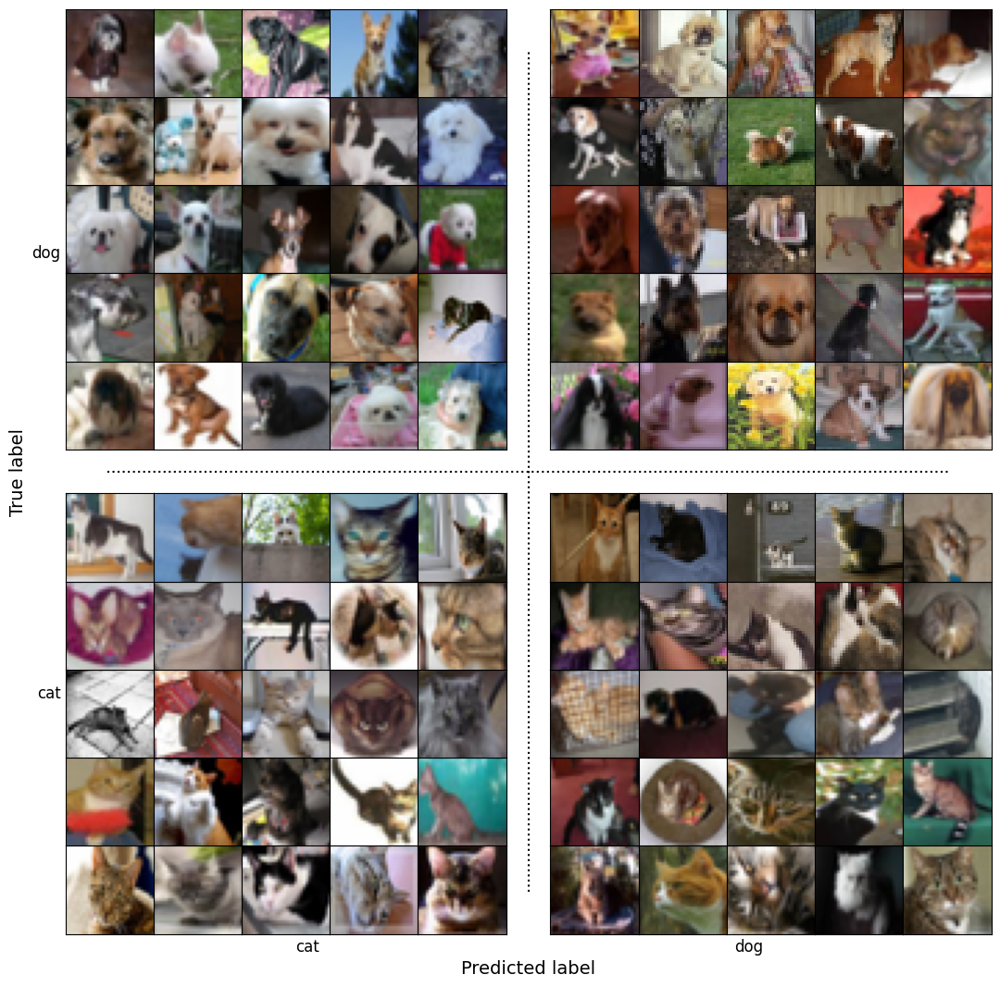

In [18]:
# Run function below to see the visualized confusion matrix (cats vs dogs) for model_mlp

# Change based on your observation of the confusion matrices
# For example, from the confusion matrix of model1, classes 3 (cat) and 5 (dog) seem to be confused.

cl_a, cl_b = 3, 5 # Integer class labels
plot_confused_classes(X_test, ys, outputs, classes, cl_a, cl_b)

# Convolutional network (15 points)
- complete the class definition below
- The network structure is provided. Feel free to modify it -- in which case, rename the class, and run the experiments below.
- The network structure is a sequence of three Conv2d, ReLU, Conv2D, ReLU, MaxPool2d, BatchNorm2d blocks.
- The final layers include two fully connected layers and an output layer with 10 units.

In [19]:
class ConvModel(nn.Module):
    def __init__(self,lr,wd):
        super().__init__()
        self.lr = lr
        self.wd = wd
        self.net = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # output: 64 x 16 x 16
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # output: 128 x 8 x 8
            nn.BatchNorm2d(128),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2), # output: 256 x 4 x 4
            nn.BatchNorm2d(256),

            nn.Flatten(),
            nn.Linear(256*4*4, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Linear(512, 10))

    def forward(self,x):
        # forward propagate x through network
        ######## START YOUR CODE HERE (1 line)
        return self.net(x)
        ######## END YOUR CODE HERE

    def loss(self,yhat,y,averaged=True):
        # compute cross-entropy loss between network output and true labels y
        # averaged over a batch
        ######## START YOUR CODE HERE (1-2 lines)
        return nn.functional.cross_entropy(yhat, y, reduction='mean' if averaged else 'none')
        ######## END YOUR CODE HERE

    def predict(self,X):
        # return the index of the highest output in the output layer
        ######## START YOUR CODE HERE (1 line)
        return torch.argmax(self.forward(X), dim=1)
        ######## END YOUR CODE HERE

    def configure_optimizers(self):
        # set up the Adam optimizer with default parameters and
        # model's learning rate and weight decay
        ######## START YOUR CODE HERE (1 line)
        return optim.Adam(self.parameters(), lr=self.lr, weight_decay=self.wd)
        ######## END YOUR CODE HERE

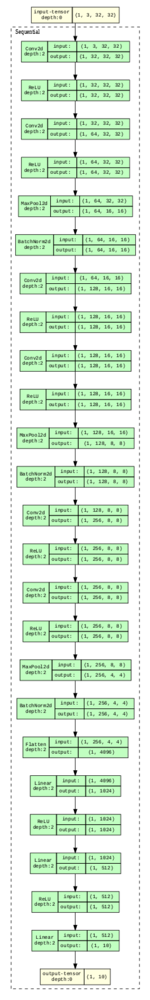

In [20]:
# Visualize the model

lr = 1e-4
wd = 1e-1
model_cnn = ConvModel(lr,wd).to(device)

cnn_model_graph = draw_graph(
        model_cnn,
        input_size=(1,3,32,32),
        expand_nested=True,
        save_graph=True,
        filename="my_CNN_model",
        directory="./"
    )

# draw the model
plt.figure(figsize=(20, 25))
plt.imshow(mpimg.imread('my_CNN_model.png'))
plt.axis('off') # Turn off axis numbers and ticks
plt.show()

# Train the model
- under two sets of hyperparameters

Epoch 1/30, Train Loss: 1.3289, Val Loss: 1.0719
Epoch 2/30, Train Loss: 0.9620, Val Loss: 0.9182
Epoch 3/30, Train Loss: 0.8185, Val Loss: 0.9540
Epoch 4/30, Train Loss: 0.7247, Val Loss: 0.8049
Epoch 5/30, Train Loss: 0.6635, Val Loss: 0.7357
Epoch 6/30, Train Loss: 0.6116, Val Loss: 0.6909
Epoch 7/30, Train Loss: 0.5723, Val Loss: 0.6952
Epoch 8/30, Train Loss: 0.5516, Val Loss: 0.6710
Epoch 9/30, Train Loss: 0.5359, Val Loss: 0.6633
Epoch 10/30, Train Loss: 0.5290, Val Loss: 0.7255
Epoch 11/30, Train Loss: 0.5254, Val Loss: 0.6646
Epoch 12/30, Train Loss: 0.5277, Val Loss: 0.7172
Epoch 13/30, Train Loss: 0.5445, Val Loss: 0.6725
Epoch 14/30, Train Loss: 0.5690, Val Loss: 0.6678
Epoch 15/30, Train Loss: 0.5965, Val Loss: 0.7907
Epoch 16/30, Train Loss: 0.6315, Val Loss: 0.7307
Epoch 17/30, Train Loss: 0.6464, Val Loss: 0.7824
Epoch 18/30, Train Loss: 0.6656, Val Loss: 0.7847
Epoch 19/30, Train Loss: 0.6752, Val Loss: 0.8053
Epoch 20/30, Train Loss: 0.6784, Val Loss: 0.7548
Epoch 21/

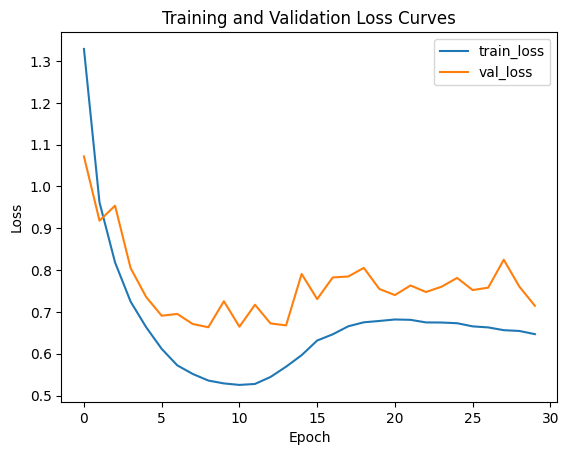

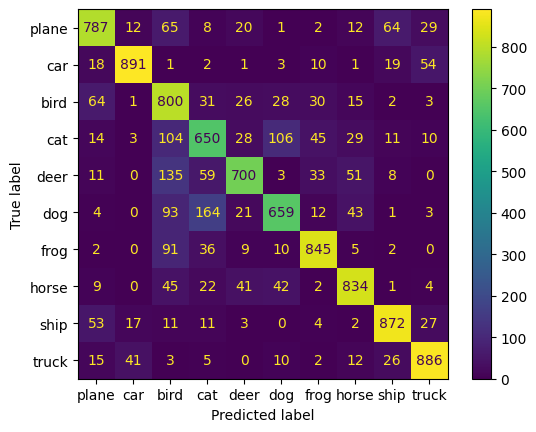

In [21]:
lr = 1e-4
wd = 1e-1
num_epochs = 30

model_cnn = ConvModel(lr,wd).to(device)
model_cnn,train_loss,val_loss = train_model(model_cnn,trainloader,valloader,num_epochs)
torch.save(model_cnn.state_dict(), 'model_cnn.pth')

# plot the validation and training loss curves
plot_loss_curves(num_epochs,train_loss,val_loss)

# run the trained model on test data and report
# accuracy, confusion matrix and classification report

X_test,ys,outputs = model_eval(model_cnn,testloader)

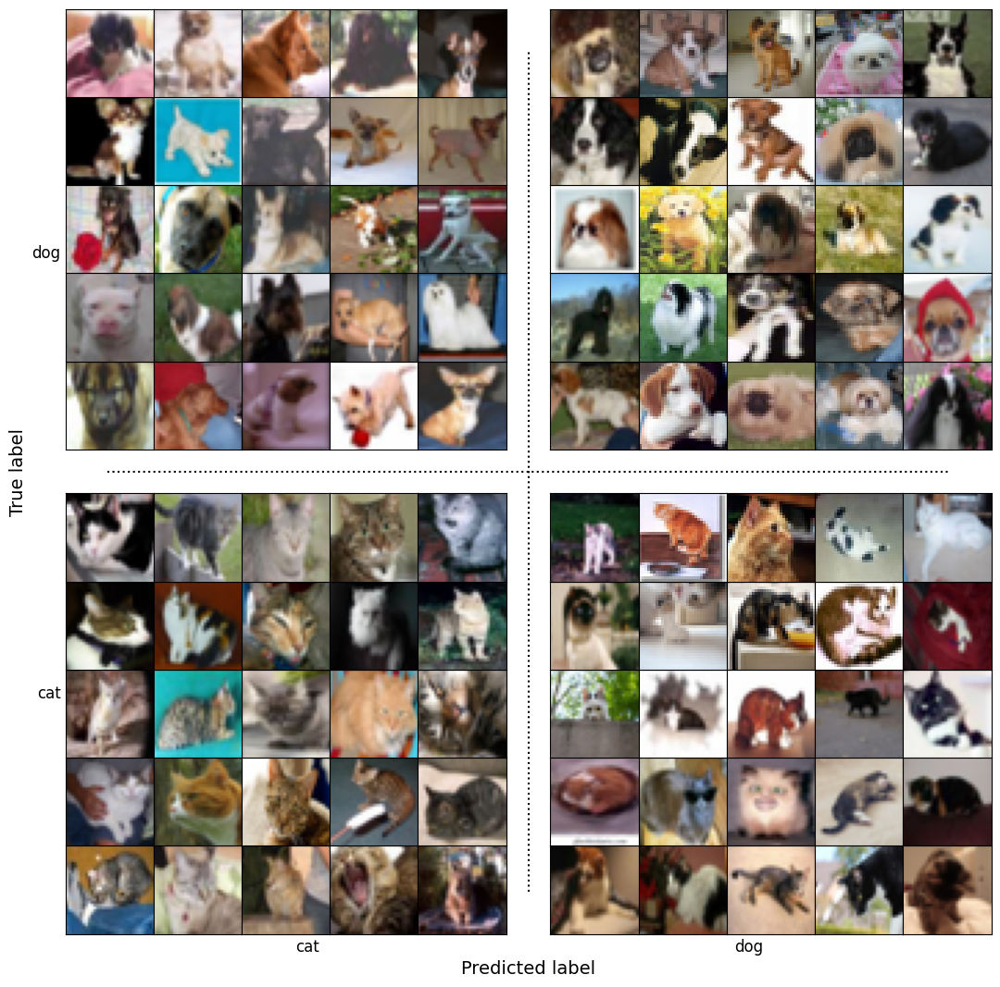

In [22]:
# visual confusion matrix
# Change based on your observation of the confusion matrices

# For example, from the confusion matrix of model1, classes 3 (cat) and 5 (dog) seem to be confused.
cl_a, cl_b = 3, 5 # Integer class labels

plot_confused_classes(X_test, ys, outputs, classes,cl_a,cl_b)

Epoch 1/20, Train Loss: 1.1992, Val Loss: 0.9072
Epoch 2/20, Train Loss: 0.7661, Val Loss: 0.7007
Epoch 3/20, Train Loss: 0.6231, Val Loss: 0.5928
Epoch 4/20, Train Loss: 0.5491, Val Loss: 0.6488
Epoch 5/20, Train Loss: 0.4802, Val Loss: 0.5743
Epoch 6/20, Train Loss: 0.4303, Val Loss: 0.5436
Epoch 7/20, Train Loss: 0.3910, Val Loss: 0.5379
Epoch 8/20, Train Loss: 0.3547, Val Loss: 0.5172
Epoch 9/20, Train Loss: 0.3314, Val Loss: 0.5500
Epoch 10/20, Train Loss: 0.3073, Val Loss: 0.4799
Epoch 11/20, Train Loss: 0.2838, Val Loss: 0.5066
Epoch 12/20, Train Loss: 0.2652, Val Loss: 0.5228
Epoch 13/20, Train Loss: 0.2547, Val Loss: 0.5144
Epoch 14/20, Train Loss: 0.2414, Val Loss: 0.5110
Epoch 15/20, Train Loss: 0.2237, Val Loss: 0.4884
Epoch 16/20, Train Loss: 0.2209, Val Loss: 0.5440
Epoch 17/20, Train Loss: 0.2149, Val Loss: 0.5092
Epoch 18/20, Train Loss: 0.2077, Val Loss: 0.5713
Epoch 19/20, Train Loss: 0.2032, Val Loss: 0.5279
Epoch 20/20, Train Loss: 0.1865, Val Loss: 0.5673
*********

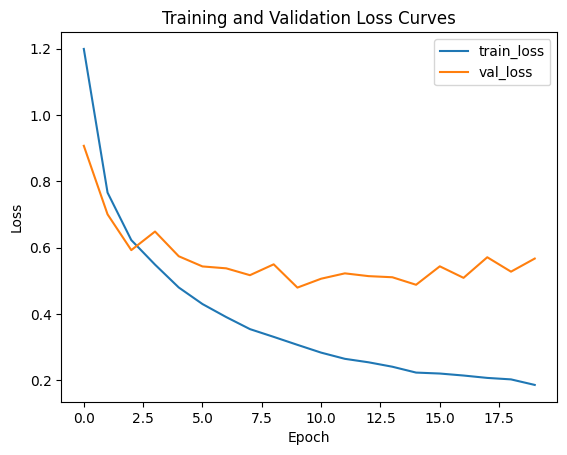

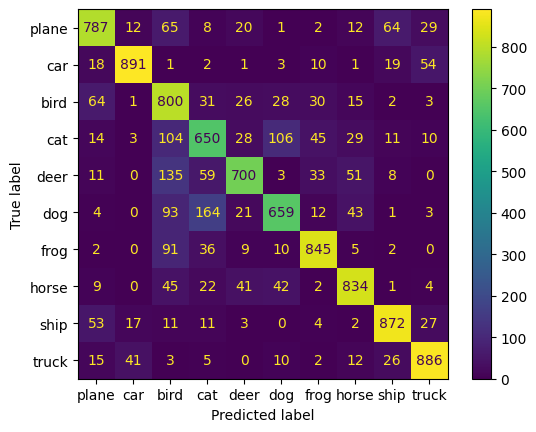

In [23]:
# hyperparameter set 2

lr = 1e-3
wd = 1e-3
num_epochs = 20

model_cnn2 = ConvModel(lr,wd).to(device)
model_cnn2,train_loss,val_loss = train_model(model_cnn2,trainloader,valloader,num_epochs)
torch.save(model_cnn2.state_dict(), 'model_cnn2.pth')

# plot the validation and training loss curves
plot_loss_curves(num_epochs,train_loss,val_loss)

# run the trained model on test data and report
# accuracy, confusion matrix and classification report

X_test,ys,outputs = model_eval(model_cnn,testloader)

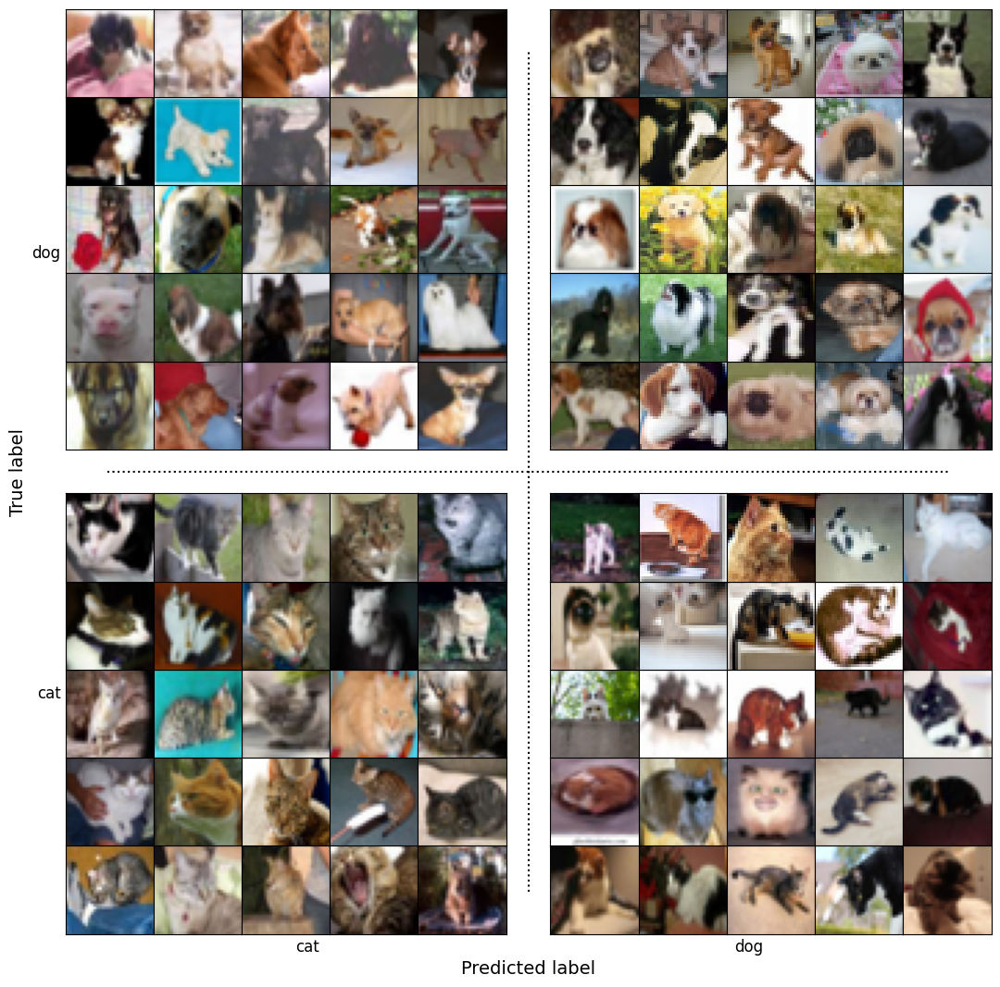

In [24]:
# visual confusion matrix
# Change based on your observation of the confusion matrices

# For example, from the confusion matrix of model1, classes 3 (cat) and 5 (dog) seem to be confused.
cl_a, cl_b = 3, 5 # Integer class labels
plot_confused_classes(X_test, ys, outputs, classes,cl_a,cl_b)

# Resnet18
- Resnet18 is a common Deep Learning model with a CNN architecture. We can access pretrained weights of this model
- The pretrained model is trained on Imagenet1k_V1 dataset.
- Resnet18 expects 224x224x3 images

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 191MB/s]


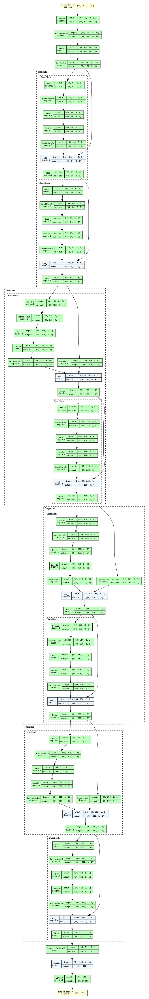

In [25]:
resnet18 = models.resnet18(weights=ResNet18_Weights.DEFAULT)

# view the model
model_graph = draw_graph(
        resnet18,
        input_size=(64, 3,32,32),  # Example: batch size 64, input features 3,32,32
        expand_nested=True,  # Set to True to expand nested modules
        save_graph=True,     # Set to True to save the graph automatically
        filename="resnet18_graph", # Desired filename for the saved graph
        directory = "./",
        device='cuda'         # Specify the device (e.g., 'cpu' or 'cuda')
    )

# draw the model
plt.figure(figsize=(20, 60))
plt.imshow(mpimg.imread('resnet18_graph.png'))
plt.axis('off') # Turn off axis numbers and ticks
plt.show()

# Using pretrained Resnet18 to classify test images of CIFAR-10
- Since the final layer of Resnet18 has 1000 units (Imagenet1K has 1000 outputs), we need to add a new fully connected layer that goes from 1000 Resnet18 outputs to the 10 ouputs that CIFAR-10 has.
- We provide a function for evaluating the pretrained Resnet18 on the CIFAR-10 testloader
-  It calculates confusion matrix, and provides a classification report

Device is:  cuda
****************************************************************************************
performance report
              precision    recall  f1-score   support

           0       0.03      0.01      0.02      1000
           1       0.01      0.00      0.00      1000
           2       0.18      0.01      0.01      1000
           3       0.13      0.04      0.06      1000
           4       0.17      0.45      0.25      1000
           5       0.07      0.02      0.03      1000
           6       0.34      0.20      0.25      1000
           7       0.08      0.00      0.00      1000
           8       0.11      0.58      0.18      1000
           9       0.06      0.01      0.01      1000

    accuracy                           0.13     10000
   macro avg       0.12      0.13      0.08     10000
weighted avg       0.12      0.13      0.08     10000

confusion matrix:


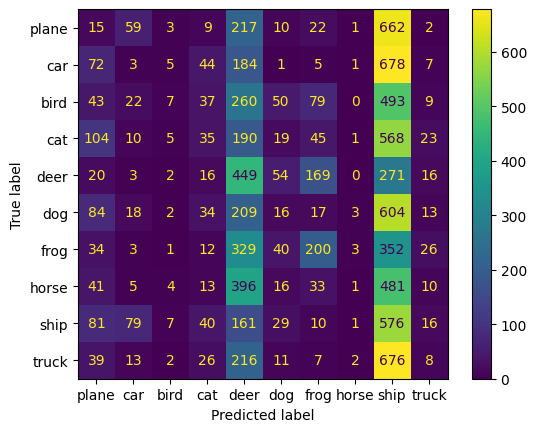

In [26]:
# make sure device is 'cuda' for this part
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Device is: ', device)

# Modify the final fully connected layer for 10 classes
num_ftrs = resnet18.fc.in_features
resnet18.fc = nn.Linear(num_ftrs, 10)
resnet18.to(device)

def model_eval_res(model,testloader):
    model.eval()
    X_test_list = [] # Use a list to store batches of test data
    with torch.no_grad():
        ys=[]
        outputs=[]
        for i, tdata in enumerate(testloader):
            tX,ty = tdata
            tX=tX.to(device)
            X_test_list.append(tX.detach().cpu().numpy())
            ty=ty.to(device)
            output = model(tX)
            output = torch.argmax(output, dim=1)
            ys.append(ty.detach().cpu().numpy())
            outputs.append(output.detach().cpu().numpy())

    X_test = np.concatenate(X_test_list)
    ys=np.hstack(ys)
    outputs= np.hstack(outputs)
    cm = sklearn.metrics.confusion_matrix(ys,outputs)
    print("****************************************************************************************")
    print("performance report")
    print(sklearn.metrics.classification_report(ys,outputs))
    print("confusion matrix:")
    disp = sklearn.metrics.ConfusionMatrixDisplay(cm,display_labels=classes)
    disp.plot()
    return X_test,ys,outputs

X_test,ys,outputs = model_eval_res(resnet18,testloader)

# Finetune Pretrained Resnet18 on CIFAR-10 (25 points)
Load a pre-trained Resnet18 model initialized with weights from Imagenet1K. Then,
add a fully connected layer at the end so final output will have 10 units.
 Set num_epochs. Define an optimizer (Adam with lr = 1e-3 and weight_decay=1e-3) (you can try other lr).
Define the loss function (nn.CrossEntropyLoss()).

Build the training loop
- Initialize train_loss and val_loss (which will hold training and validation set loss for each epoch)



 - for epoch in range(num_epochs)
    - for each batch (Xtr,ytr) in training set
     - - move Xtr and ytr to cuda device with .to(device)
       - zero out gradients in the optimizer
       -  compute output of network by calling resnet18(Xtr)
       -  compute loss using output and ytr
       - backpropagate the loss
       -  update the parameters (with .step() on optimizer)
       -  accumulate the training loss for this batch
    - store training loss for this epoch
    - compute validation set loss for this epoch (remember to turn off gradient update with torch.no_grad()) and remember to iterate over all the batches of the validation set
    
- return model, train_loss and val_loss


In [29]:
# Load a pre-trained ResNet18 model
resnet18 = models.resnet18(weights=ResNet18_Weights.DEFAULT)

# Modify the final fully connected layer to match the number of classes in CIFAR-10
num_ftrs = resnet18.fc.in_features
resnet18.fc = nn.Linear(num_ftrs, 10)

# Move the model to the appropriate device
resnet18 = resnet18.to(device)

# set num_epochs
num_epochs = 10
# Define the optimizer and loss function
optimizer = optim.Adam(resnet18.parameters(), lr=1e-3, weight_decay=1e-3) # You can adjust the learning rate
criterion = nn.CrossEntropyLoss()

def resnet18_train(resnet18,optimizer,criterion,num_epochs,trainloader,valloader):

    # START YOUR CODE HERE (20-24 lines)
    train_loss_resnet = []
    val_loss_resnet = []
    resnet18.to(device)

    for epoch in range(num_epochs):
        resnet18.train()
        running_train_loss = 0.0
        for i, data in enumerate(trainloader):
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs = resnet18(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_train_loss += loss.item()

        train_loss_resnet.append(running_train_loss / len(trainloader))

        resnet18.eval()
        running_val_loss = 0.0
        with torch.no_grad():
            for i, data in enumerate(valloader):
                inputs, labels = data
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = resnet18(inputs)
                loss = criterion(outputs, labels)
                running_val_loss += loss.item()
        val_loss_resnet.append(running_val_loss / len(valloader))

        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss_resnet[-1]:.4f}, Val Loss: {val_loss_resnet[-1]:.4f}')

    # END YOUR CODE HERE
    return resnet18, train_loss_resnet, val_loss_resnet

# Train the model and get the loss values
resnet18, train_loss_resnet, val_loss_resnet = resnet18_train(resnet18, optimizer, criterion, num_epochs, trainloader, valloader)


# Save the fine-tuned model
torch.save(resnet18.state_dict(), 'resnet18_cifar10.pth')

Epoch 1/10, Train Loss: 1.0011, Val Loss: 0.7801
Epoch 2/10, Train Loss: 0.7411, Val Loss: 0.9098
Epoch 3/10, Train Loss: 0.6581, Val Loss: 0.7193
Epoch 4/10, Train Loss: 0.5887, Val Loss: 0.6900
Epoch 5/10, Train Loss: 0.5429, Val Loss: 0.7298
Epoch 6/10, Train Loss: 0.5066, Val Loss: 0.6652
Epoch 7/10, Train Loss: 0.4597, Val Loss: 0.6782
Epoch 8/10, Train Loss: 0.4384, Val Loss: 0.6455
Epoch 9/10, Train Loss: 0.4163, Val Loss: 0.6739
Epoch 10/10, Train Loss: 0.3847, Val Loss: 0.7145


# Evaluate performance of model tuned on CIFAR-10 data

****************************************************************************************
performance report
              precision    recall  f1-score   support

           0       0.71      0.87      0.78      1000
           1       0.89      0.83      0.86      1000
           2       0.85      0.56      0.68      1000
           3       0.56      0.70      0.63      1000
           4       0.77      0.82      0.79      1000
           5       0.74      0.58      0.65      1000
           6       0.72      0.90      0.80      1000
           7       0.88      0.79      0.83      1000
           8       0.85      0.86      0.86      1000
           9       0.85      0.80      0.82      1000

    accuracy                           0.77     10000
   macro avg       0.78      0.77      0.77     10000
weighted avg       0.78      0.77      0.77     10000

confusion matrix:


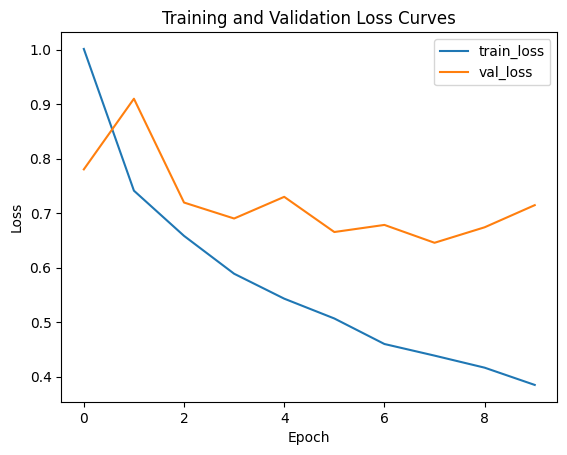

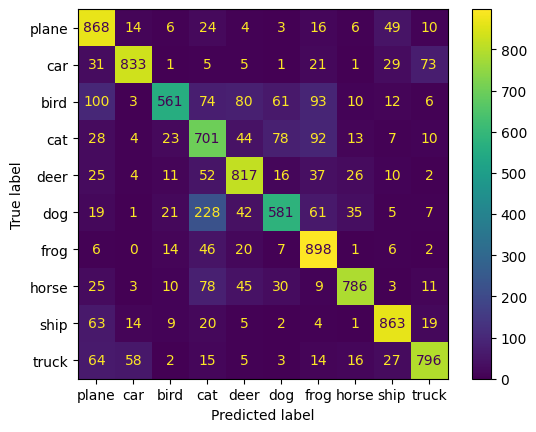

In [30]:
plot_loss_curves(num_epochs,train_loss_resnet,val_loss_resnet)

X_test, ys, outputs = model_eval_res(resnet18,testloader)

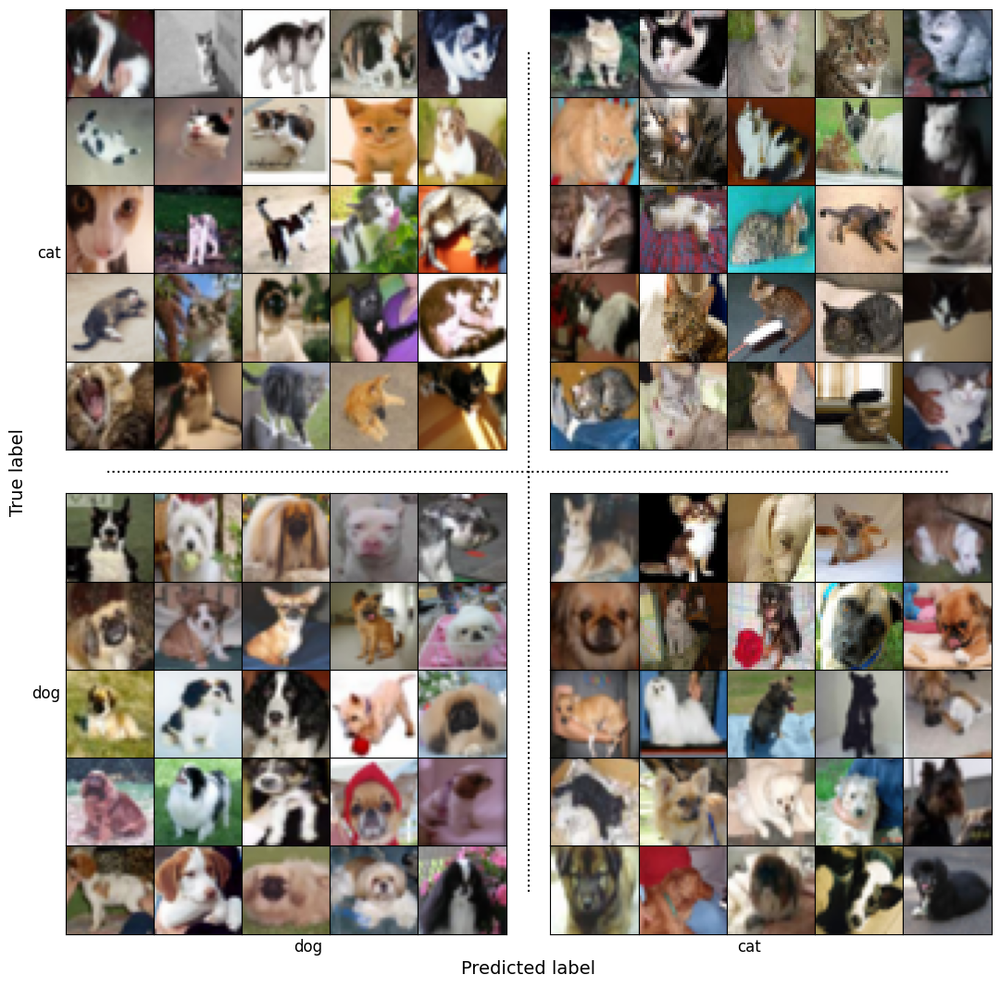

In [31]:
# For resnet model finetuned on cifar10

# Change based on your observation of the confusion matrices
# For example, from the confusion matrix of model1, classes 3 (cat) and 5 (dog) seem to be confused.
cl_a, cl_b = 5, 3 # Integer class labels

plot_confused_classes(X_test, ys, outputs, classes, cl_a, cl_b)

# Resnet training with data augmentation
- data augmentation is tricky. We have already selected the transforms for the training set. Make alterations to this sequence with care.
- For the test set, we resize the 32x32x3 images to 224x224x3 and normalize using the known tmean/tstd

In [32]:
# set transforms
transform_train = transforms.Compose(
    [transforms.Resize(img_size),
     transforms.RandomRotation(20),
     transforms.RandomHorizontalFlip(0.1),
     transforms.ColorJitter(brightness=0.1,contrast = 0.1 ,saturation =0.1 ),
     transforms.RandomAdjustSharpness(sharpness_factor = 2, p = 0.1),
     transforms.ToTensor(),
     transforms.Normalize(tmean,tstd),
     transforms.RandomErasing(p=0.75,scale=(0.02, 0.1),value=1.0, inplace=False)])
transform_test = transforms.Compose(
    [transforms.Resize(img_size),
     transforms.ToTensor(),
     transforms.Normalize(tmean,tstd)])

# download and transform the  trainset and testset for training
trainset_aug = torchvision.datasets.CIFAR10(root='./data',train=True,download=True,transform=transform_train)
testset_aug = torchvision.datasets.CIFAR10(root='./data',train=False,download=True,transform=transform_test)

#split trainset into a train and a val set (90-10 split)
lengths_aug = [int(p * len(trainset_aug)) for p in [0.9,0.1]]
tr_aug,v_aug = torch.utils.data.random_split(trainset_aug,lengths_aug)
train_sampler_aug = torch.utils.data.SubsetRandomSampler(tr_aug.indices)
val_sampler_aug = torch.utils.data.SubsetRandomSampler(v_aug.indices)

# set batch size and set up the data generators for train, val, test sets
batch_size = 64 # reduce batch size to 8, otherwise training time is quite long..
trainloader_aug = torch.utils.data.DataLoader(trainset_aug,batch_size=batch_size,sampler=train_sampler_aug)
valloader_aug = torch.utils.data.DataLoader(trainset_aug,batch_size=batch_size,sampler=val_sampler_aug)
testloader_aug = torch.utils.data.DataLoader(testset_aug, batch_size=batch_size)

print("Number of training batches = ",len(trainloader_aug))
print("Number of validation batches = ",len(valloader_aug))
print("Number of test batches = ",len(testloader_aug))

Number of training batches =  704
Number of validation batches =  79
Number of test batches =  157


# Train resnet18 with augmented CIFAR-10 data

In [33]:
# Load a pre-trained ResNet18 model
resnet18_aug = models.resnet18(weights=ResNet18_Weights.DEFAULT)

# Modify the final fully connected layer to match the number of classes in CIFAR-10
num_ftrs = resnet18_aug.fc.in_features
resnet18_aug.fc = nn.Linear(num_ftrs, 10)

# Move the model to the appropriate device
resnet18_aug = resnet18_aug.to(device)

# set num_epochs
num_epochs = 10

# Define the optimizer and loss function
optimizer = optim.SGD(resnet18_aug.parameters(), lr=1e-3, momentum=0.9) # You can adjust the learning rate
# add weight decay at 1e-3 for better results
# Adam optimizer tends to overfit
# trying to imitate https://www.kaggle.com/code/abdelrahmanhesham601/resnet-18-fine-tuning-on-cifar-10

criterion = nn.CrossEntropyLoss()

# Train the model on augmented data
resnet18_aug, train_loss_resnet, val_loss_resnet = resnet18_train(resnet18_aug,optimizer,criterion,num_epochs,
                                                                  trainloader_aug,valloader_aug)

Epoch 1/10, Train Loss: 0.6712, Val Loss: 0.3337
Epoch 2/10, Train Loss: 0.3027, Val Loss: 0.2540
Epoch 3/10, Train Loss: 0.2375, Val Loss: 0.2359
Epoch 4/10, Train Loss: 0.1996, Val Loss: 0.2142
Epoch 5/10, Train Loss: 0.1709, Val Loss: 0.2128
Epoch 6/10, Train Loss: 0.1474, Val Loss: 0.1917
Epoch 7/10, Train Loss: 0.1299, Val Loss: 0.1896
Epoch 8/10, Train Loss: 0.1172, Val Loss: 0.1731
Epoch 9/10, Train Loss: 0.1076, Val Loss: 0.1685
Epoch 10/10, Train Loss: 0.0987, Val Loss: 0.1838


In [34]:
"""
To save memory, we rewrite the model_eval_res() and the corresponding plot_confused_classes()
"""
def model_eval_res(model, testloader):
    with torch.no_grad():
        ys = []
        outputs = []
        indices_list = []
        batch_start = 0

        for i, (tX, ty) in enumerate(testloader):
            tX = tX.to(device)
            ty = ty.to(device)

            output = model(tX)
            output = torch.argmax(output, dim=1)

            # save labels and preds
            ys.append(ty.detach().cpu().numpy())
            outputs.append(output.detach().cpu().numpy())

            # save the corresponding data indices
            batch_size = len(ty)
            batch_indices = list(range(batch_start, batch_start + batch_size))
            indices_list.extend(batch_indices)
            batch_start += batch_size

    ys = np.hstack(ys)
    outputs = np.hstack(outputs)
    indices = np.array(indices_list)

    # evaluate
    cm = sklearn.metrics.confusion_matrix(ys, outputs)
    print("****************************************************************************************")
    print("performance report")
    print(sklearn.metrics.classification_report(ys, outputs))
    print("confusion matrix:")
    disp = sklearn.metrics.ConfusionMatrixDisplay(cm, display_labels=classes)
    disp.plot()

    return indices, ys, outputs  # return indices now rather than the raw data


def plot_confused_classes(X_test_indices, target_dataset, all_y_true, all_y_pred, classes, cl_a, cl_b):
    X_aa_indices = X_test_indices[(all_y_true == cl_a) & (all_y_pred == cl_a)]
    X_ab_indices = X_test_indices[(all_y_true == cl_a) & (all_y_pred == cl_b)]
    X_ba_indices = X_test_indices[(all_y_true == cl_b) & (all_y_pred == cl_a)]
    X_bb_indices = X_test_indices[(all_y_true == cl_b) & (all_y_pred == cl_b)]

    size = 5   # grid size inside each confusion block
    pad = 0.5  # spacing between quadrants
    total = 2 * size + pad  # logical grid size

    fig = plt.figure(figsize=(size*2, size*2))

    # Loop through quadrants
    for test_indices, (true_row, pred_col) in [
        (X_aa_indices, (0, 0)),  # true A, pred A
        (X_ab_indices, (0, 1)),  # true A, pred B
        (X_ba_indices, (1, 0)),  # true B, pred A
        (X_bb_indices, (1, 1)),  # true B, pred B
    ]:
        images=[target_dataset[test_index][0].cpu().numpy() for test_index in test_indices]
        for idx, image_data in enumerate(images[:size*size]):
            # Grid position in "data units"
            x = idx % size + pred_col * (size + pad)
            y = idx // size + true_row * (size + pad)

            # Normalize to figure coords [0,1]
            ax = fig.add_axes([x / total,
                               y / total,
                               1 / total,
                               1 / total])

            img = denormalize(image_data)
            ax.imshow(img)
            ax.set_xticks([])
            ax.set_yticks([])

       # Add invisible overlay axis (in figure space)
    ax_main = fig.add_axes([0, 0, 1, 1], frameon=False)
    ax_main.set_xticks([ (size/2)/total, (size+pad+size/2)/total ])
    ax_main.set_xticklabels([classes[cl_a], classes[cl_b]], fontsize=12)

    ax_main.set_yticks([ (size/2)/total, (size+pad+size/2)/total ])
    ax_main.set_yticklabels([classes[cl_a], classes[cl_b]], fontsize=12)

    ax_main.set_xlabel("Predicted label", fontsize=14)
    ax_main.set_ylabel("True label", fontsize=14)

    # Hide tick marks and spines
    ax_main.tick_params(axis='both', which='both', length=0)
    for spine in ax_main.spines.values():
        spine.set_visible(False)

    # Divider lines in normalized coords
    ax_main.plot([ (size+pad/2)/total, (size+pad/2)/total ], [0,1], "k:")
    ax_main.plot([0,1], [ (size+pad/2)/total, (size+pad/2)/total ], "k:")

    plt.show()

# Evaluate the model trained on augmented CIFAR-10 data

****************************************************************************************
performance report
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      1000
           1       0.97      0.98      0.97      1000
           2       0.95      0.96      0.95      1000
           3       0.90      0.90      0.90      1000
           4       0.96      0.96      0.96      1000
           5       0.90      0.93      0.91      1000
           6       0.98      0.98      0.98      1000
           7       0.98      0.95      0.97      1000
           8       0.97      0.98      0.97      1000
           9       0.98      0.97      0.97      1000

    accuracy                           0.96     10000
   macro avg       0.96      0.96      0.96     10000
weighted avg       0.96      0.96      0.96     10000

confusion matrix:


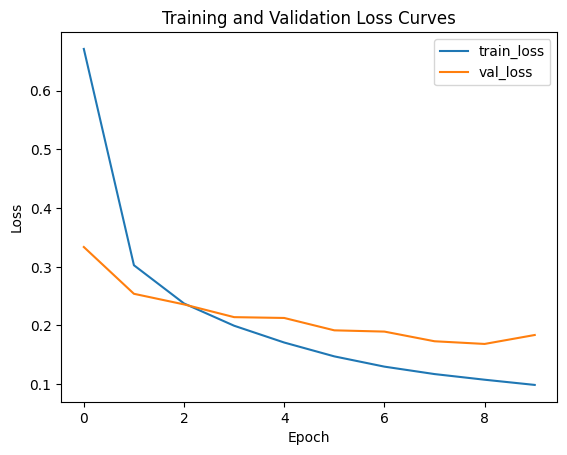

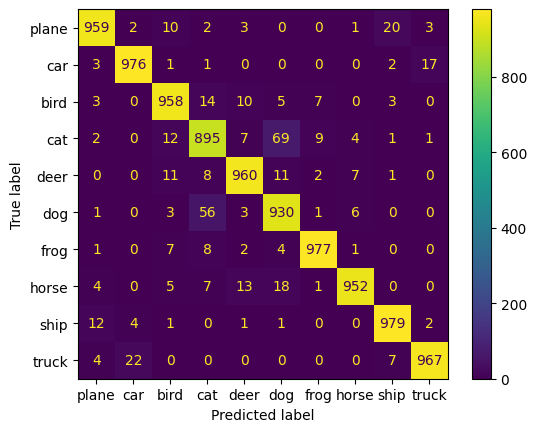

In [35]:
plot_loss_curves(num_epochs,train_loss_resnet,val_loss_resnet)

X_test_indices, ys, outputs = model_eval_res(resnet18_aug,testloader_aug)

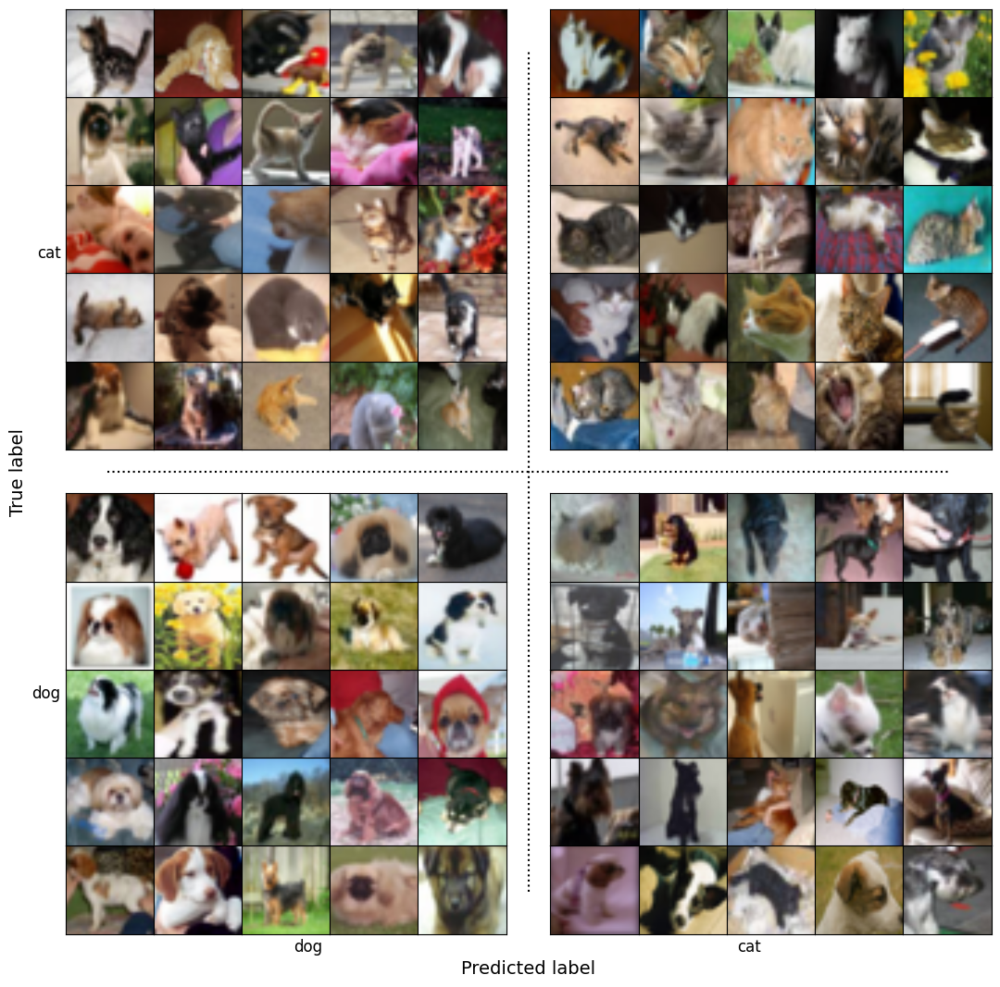

In [36]:
plot_confused_classes(X_test_indices, testset_aug, ys, outputs, classes, cl_a, cl_b)

# Comment (50 points)
- performance difference between multilayer feedforward and convolutional neural nets
- difference in the number of parameters between the two classes of deep models
- impact of learning rate and weight decay choice on the feedforward networks
- impact of learning rate and weight decay choice on convolutional networks
- experiment with these two hyperparameters to achieve > 50% accuracy with feedforward networks, and > 80% accuracy with convolutional networks
- explain out-of-the-box performance of Restnet18 with pretrained weights on CIFAR-10
- explain the impact of tuning Resnet18 weights with CIFAR-10 data -- play with hyperparameters to get about 80% accuracy with this model
- explain the impact of tuning Resnet18 weights with CIFAR-10 data -- you should be able to get about 94% accuracy with this model with the suggested hyperparameters.


Here are some comments based on the experimental results:

**Performance difference between multilayer feedforward and convolutional neural nets:**

Based on the reported accuracies:
- The fully connected (MLP) model achieved an accuracy of around 17% on the test set.
- The convolutional neural network (CNN) model achieved an accuracy of around 79% on the test set (with both sets of hyperparameters tested).

This shows a significant performance difference, with the CNN model performing much better on the image classification task. This is expected because CNNs are designed to handle spatial hierarchies in data like images through convolutional layers, which are much more effective at extracting relevant features compared to the flattened input used by MLPs.

**Difference in the number of parameters between the two classes of deep models:**

To determine the exact number of parameters, we would typically print the model summary or iterate through the model's parameters. However, based on the architecture definitions:
- The FiveLayerFC model flattens the 32x32x3 input (3072 features) and connects it to two hidden layers (e.g., 100 units each) and an output layer (10 units). The number of parameters grows rapidly with the number of hidden units and the input size.
- The ConvModel uses convolutional layers, pooling, and batch normalization before flattening and passing to fully connected layers. While CNNs can have many parameters, especially in the later fully connected layers, the parameter sharing in convolutional layers often makes them more parameter-efficient for image data compared to a fully connected network with a similar number of layers and equivalent receptive field size covering the entire input.

Let's add code to print the number of parameters for each model to provide a concrete comparison.

**Impact of learning rate and weight decay choice on the feedforward networks:**

For the FiveLayerFC model trained on the full dataset:
- With `lr = 1e-5` and `wd = 1e-2`, the model achieved around 17% accuracy.
- (Need to run experiments with other hyperparameter choices to fully assess impact).

**Impact of learning rate and weight decay choice on convolutional networks:**

For the ConvModel:
- With `lr = 1e-4` and `wd = 1e-1`, the model achieved around 79% accuracy.
- With `lr = 1e-3` and `wd = 1e-3`, the model also achieved around 79% accuracy.
- (Need to run experiments with other hyperparameter choices to fully assess impact and see if we can reach > 80% with this architecture).

**Experimentation to achieve > 50% accuracy with feedforward networks and > 80% accuracy with convolutional networks:**

- **Feedforward:** Achieving > 50% accuracy with a simple FiveLayerFC on CIFAR-10 is challenging due to the nature of the data and the model's limitations in capturing spatial information. It might require significant tuning of hyperparameters, potentially larger hidden layers, and longer training, but might still struggle to reach high accuracy compared to CNNs.
- **Convolutional:** The current ConvModel achieved close to 80% accuracy. Further hyperparameter tuning (learning rate, weight decay, optimizer, number of epochs), potentially adding more layers or different types of layers (e.g., dropout), or using more advanced architectures could help surpass the 80% mark.

**Explanation of out-of-the-box performance of Resnet18 with pretrained weights on CIFAR-10:**

The pretrained Resnet18 model, when evaluated directly on CIFAR-10 with only the final layer modified for 10 classes, achieved a very low accuracy (around 13%). This is because:
- **Domain mismatch:** The model was pretrained on ImageNet, which has 1000 classes and different image characteristics compared to CIFAR-10 (e.g., resolution, types of objects). The features learned on ImageNet are not perfectly aligned with the features needed for CIFAR-10 classification.
- **Final layer is random:** While the convolutional base has learned features, the newly added final fully connected layer is randomly initialized and has not been trained to map these features to the 10 CIFAR-10 classes.

**Explanation of the impact of tuning Resnet18 weights with CIFAR-10 data:**

- **Finetuning impact (getting ~80% accuracy):** When the pretrained Resnet18 is fine-tuned on CIFAR-10, the performance significantly improves to around 77% accuracy (with the hyperparameters used). This is because the model leverages the powerful features learned during pretraining on a large dataset (ImageNet) and adapts them to the specific task of classifying CIFAR-10 images. The fine-tuning process adjusts the weights of the pretrained layers (and trains the new final layer) to better suit the CIFAR-10 data distribution.
- **Finetuning with data augmentation impact (getting ~94% accuracy):** Training the Resnet18 with data augmentation (using the provided `trainloader_aug`) resulted in a much higher accuracy of around 96%. Data augmentation artificially increases the size and diversity of the training dataset by applying various transformations (rotation, flipping, color jitter, random erasing). This helps the model generalize better to unseen data, makes it more robust to variations in the input images, and reduces overfitting, leading to a substantial performance improvement.

**Comment on parameter counts:**

Let's add a code cell to calculate and print the number of parameters for each model to support the discussion on parameter efficiency.

In [37]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

# Assuming model_mlp and model_cnn are the trained models from previous steps
# If not, you might need to load their state dicts

print(f"Number of parameters in FiveLayerFC model: {count_parameters(model_mlp)}")
print(f"Number of parameters in ConvModel: {count_parameters(model_cnn)}")
print(f"Number of parameters in finetuned Resnet18 model: {count_parameters(resnet18)}")
print(f"Number of parameters in finetuned Resnet18 model with augmentation: {count_parameters(resnet18_aug)}")

Number of parameters in FiveLayerFC model: 656810
Number of parameters in ConvModel: 5852234
Number of parameters in finetuned Resnet18 model: 11181642
Number of parameters in finetuned Resnet18 model with augmentation: 11181642


In [ ]:
# Comments here